<a href="https://colab.research.google.com/github/aaaaaamah99/Computer_Vision/blob/main/UTS_PSB.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
shayanfazeli_heartbeat_path = kagglehub.dataset_download('shayanfazeli/heartbeat')

print('Data source import complete.')


**PREPARATION**

In [ ]:
!pip install numpy pandas tensorflow keras scikit-learn

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import os
%matplotlib inline

**LOAD DATA**

In [ ]:
train_data = pd.read_csv('/kaggle/input/heartbeat/mitbih_train.csv',header = None)
print('train data = ', train_data.columns)

train data =  Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
       ...
       178, 179, 180, 181, 182, 183, 184, 185, 186, 187],
      dtype='int64', length=188)


In [ ]:
test_data = pd.read_csv('/kaggle/input/heartbeat/mitbih_test.csv', header = None)
print('test data = ', test_data.columns)

test data =  Index([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,
       ...
       178, 179, 180, 181, 182, 183, 184, 185, 186, 187],
      dtype='int64', length=188)


**DATA INFORMATION**

In [ ]:
train_target = train_data[187].value_counts()
train_target

187
0.0    72471
4.0     6431
2.0     5788
1.0     2223
3.0      641
Name: count, dtype: int64

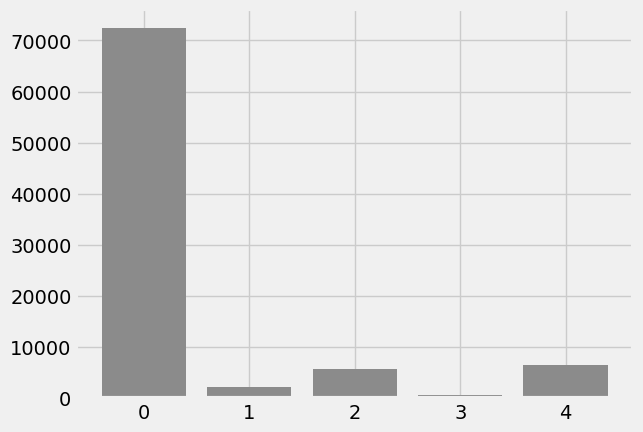

In [ ]:
plt.bar(train_target.index,train_target.values, color = sb.color_palette()[4]);

In [ ]:
np.random.seed(42)
sample = np.random.choice(train_data.shape[0], 80000, replace = False)
subset = train_data.loc[sample]
subset

,0,1,2,3,4,5,6,7,8,9,...,178,179,180,181,182,183,184,185,186,187
10563,0.965812,0.792023,0.116809,0.000000,0.162393,0.213675,0.264957,0.247863,0.270655,0.259259,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25843,1.000000,0.597015,0.000000,0.109453,0.094527,0.084577,0.074627,0.094527,0.114428,0.124378,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15891,0.831382,0.714286,0.491803,0.206089,0.086651,0.042155,0.032787,0.025761,0.046838,0.032787,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
62606,1.000000,0.837705,0.236066,0.037705,0.252459,0.329508,0.319672,0.306557,0.304918,0.306557,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
84283,0.868590,0.448718,0.490385,0.477564,0.461538,0.455128,0.416667,0.304487,0.182692,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71318,0.959528,0.962901,0.411467,0.000000,0.209106,0.286678,0.283305,0.295110,0.293423,0.279933,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
71218,1.000000,0.815029,0.242775,0.017341,0.078035,0.063584,0.075145,0.060694,0.063584,0.057803,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9493,0.946050,0.749518,0.425819,0.146435,0.000000,0.000000,0.038536,0.059730,0.075145,0.059730,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3981,0.935622,0.961373,0.450644,0.064378,0.248927,0.386266,0.347639,0.345494,0.358369,0.349785,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
percentages = [count / subset.shape[0] * 100 for count in subset[187].value_counts()]
percentages[0]

82.7375

In [ ]:
for i in np.arange(len(percentages)):
    print(f'the precent of {int(train_target.index[i])} is : {np.round(percentages[i], 2) } %')

the precent of 0 is : 82.74 %
the precent of 4 is : 7.38 %
the precent of 2 is : 6.59 %
the precent of 1 is : 2.56 %
the precent of 3 is : 0.74 %


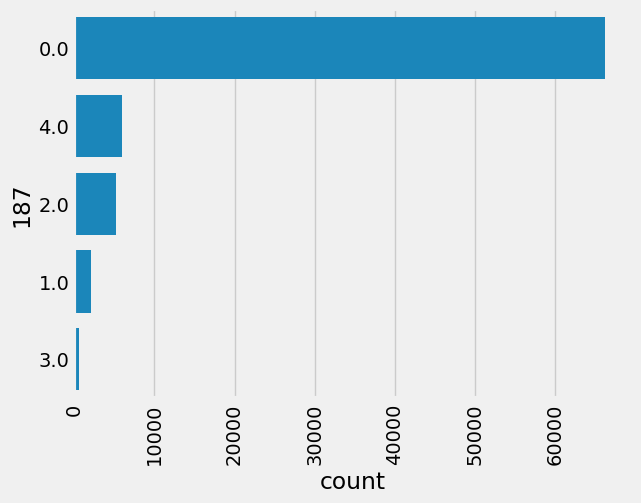

In [ ]:
base_color = sb.color_palette()[0]
type_orderion = subset[187].value_counts().index
sb.countplot(data = subset, y = 187, color = base_color, order = type_orderion );
plt.xticks(rotation = 90);

In [ ]:
from sklearn.utils import resample
target1=train_data[train_data[187]==1]
target2=train_data[train_data[187]==2]
target3=train_data[train_data[187]==3]
target0=(train_data[train_data[187]==0]).sample(n=20000,random_state=42)

target1_sample=resample(target1,replace=True,n_samples=20000,random_state=0)
target2_sample=resample(target2,replace=True,n_samples=20000,random_state=0)
target3_sample=resample(target3,replace=True,n_samples=20000,random_state=0)

train_data=pd.concat([target0,target1_sample,target2_sample,target3_sample])

In [ ]:
train_target = train_data[187].value_counts()
train_targettrain_target = train_data[187].value_counts()
train_target

187
0.0    20000
1.0    20000
2.0    20000
3.0    20000
Name: count, dtype: int64

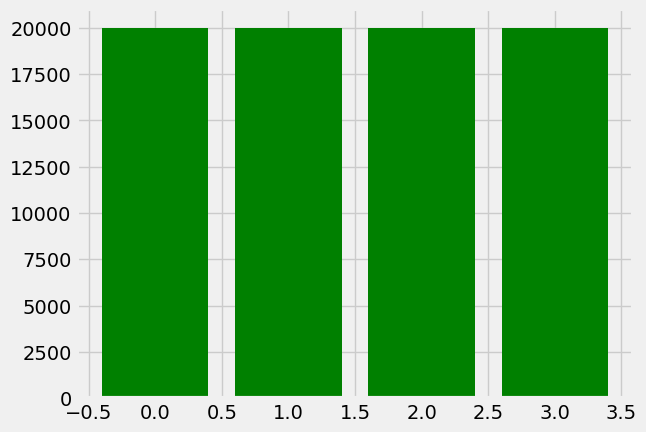

In [ ]:
plt.bar(train_target.index,train_target.values, color = 'green');

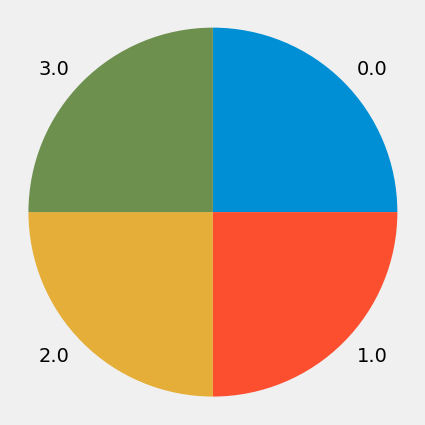

In [ ]:
sorted_counts = train_data[187].value_counts();
plt.figure(figsize = [12,5.01])
plt.pie(sorted_counts, labels = sorted_counts.index, startangle = 90,
        counterclock = False);
plt.axis('square');

In [ ]:
test_target = test_data[187].value_counts()
test_target

187
0.0    18118
4.0     1608
2.0     1448
1.0      556
3.0      162
Name: count, dtype: int64

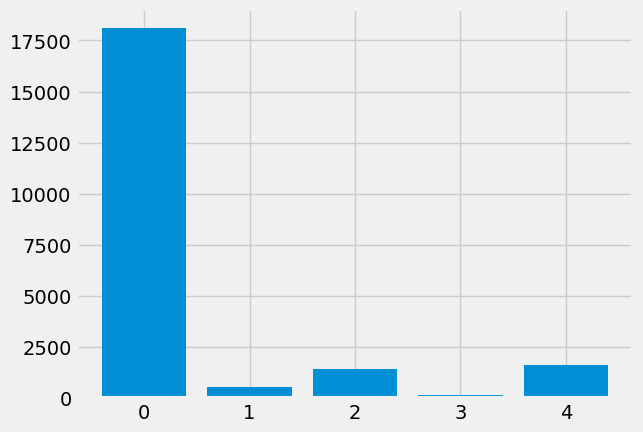

In [ ]:
plt.bar(test_target.index,test_target.values, color = sb.color_palette()[0]);

In [ ]:
np.random.seed(123)
sample2 = np.random.choice(test_data.shape[0], 200, replace = False)
subset2 = test_data.loc[sample2]

In [ ]:
percentages = [count / subset2.shape[0] * 100 for count in subset2[187].value_counts()]
percentages[0]

85.0

In [ ]:
for i in np.arange(len(percentages)):
    print(f'the precent of {int(test_data.index[i])} is : {np.round(percentages[i], 2) } %')

the precent of 0 is : 85.0 %
the precent of 1 is : 7.5 %
the precent of 2 is : 4.0 %
the precent of 3 is : 2.0 %
the precent of 4 is : 1.5 %


In [ ]:
from sklearn.utils import resample
target1=test_data[test_data[187]==1]
target2=test_data[test_data[187]==2]
target3=test_data[test_data[187]==3]
target0=(test_data[test_data[187]==0]).sample(n=2000,random_state=0)

target1_sample=resample(target1,replace=True,n_samples=2000,random_state=0)
target2_sample=resample(target2,replace=True,n_samples=2000,random_state=0)
target3_sample=resample(target3,replace=True,n_samples=2000,random_state=0)

test_data=pd.concat([target0,target1_sample,target2_sample,target3_sample])

In [ ]:
test_target = test_data[187].value_counts()
test_target

187
0.0    2000
1.0    2000
2.0    2000
3.0    2000
Name: count, dtype: int64

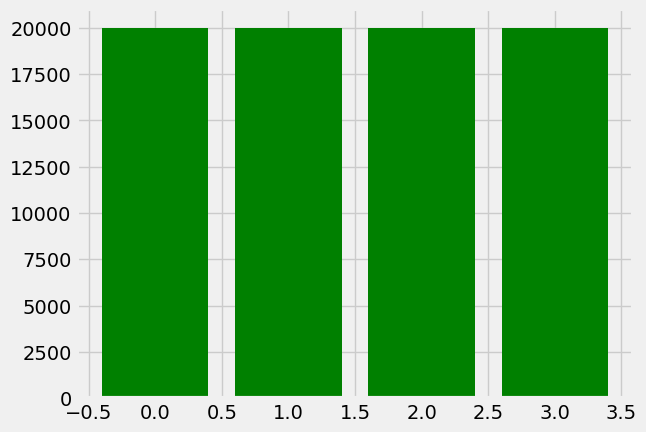

In [ ]:
plt.bar(train_target.index,train_target.values, color = 'green');

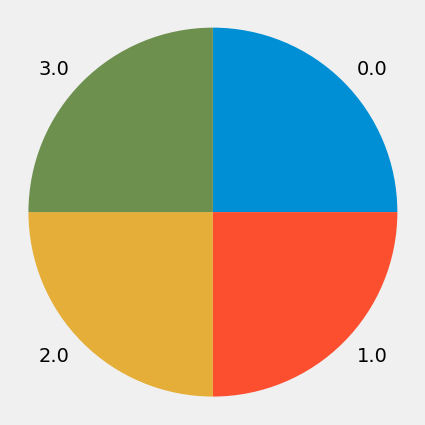

In [ ]:
sorted_counts = train_data[187].value_counts();
plt.figure(figsize = [12,5.01])
plt.pie(sorted_counts, labels = sorted_counts.index, startangle = 90,
        counterclock = False);
plt.axis('square');

In [ ]:
from scipy import stats
pearson_coef, p_value = stats.pearsonr(train_data[1], train_data[187])
l = [('1', 1),('2',2),('3',3)]
if max(l):
    print(l)
max(l)

[('1', 1), ('2', 2), ('3', 3)]


('3', 3)

In [ ]:
effictive_list = []
for i in train_data.columns:
    if i != 205:
        pearson_coef, p_value = stats.pearsonr(train_data[i], train_data[187])
        effictive_list.append((f'column number : {i}', f'Pearson Correlation {pearson_coef}', f'P-value : {p_value}'))
    else: break
print('*' * 75)
print(max(effictive_list))
print('*' * 75)

***************************************************************************
('column number : 99', 'Pearson Correlation -0.18652463598371377', 'P-value : 0.0')
***************************************************************************


**PREPROCESSING**

GAUSSIAN NOISE

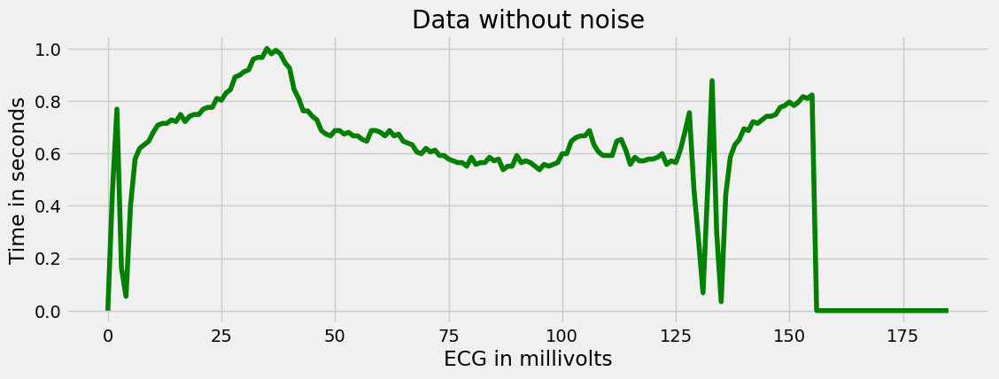

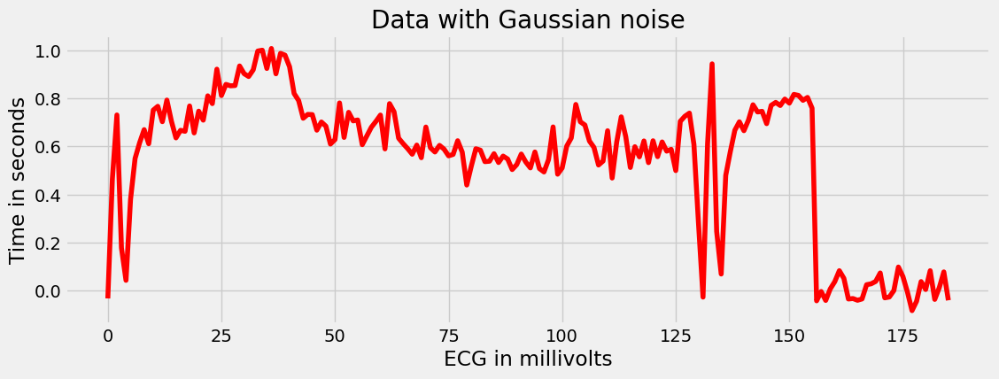

In [ ]:
def add_gaussian_noise(signal):
    noise = np.random.normal(0, 0.05, signal.shape)  # Adjust to match the signal's shape
    return signal + noise

# Add noise to the first row's first 188 columns
noise_data = add_gaussian_noise(train_data.iloc[0, :186])

# Plot the original data
plt.figure(figsize=[12, 4.02])
plt.plot(train_data.iloc[0, :186], color='green')
plt.title('Data without noise')
plt.xlabel('ECG in millivolts')
plt.ylabel('Time in seconds')

# Plot data with noise
plt.figure(figsize=[12, 4.02])
plt.plot(noise_data, color='red')
plt.title('Data with Gaussian noise')
plt.xlabel('ECG in millivolts')
plt.ylabel('Time in seconds')
plt.show()


In [ ]:
len(train_data.columns)/60

3.1333333333333333

In [ ]:
df = train_data.copy()

In [ ]:
counter = 0
while counter <= len(df.columns):
    if counter != 186:
        df[counter] = df[counter] + df[counter + 1] + df[counter + 2]
        counter += 3
    else: break

In [ ]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,178,179,180,181,182,183,184,185,186,187
4780,1.217687,0.448980,0.768707,0.619048,0.054422,0.401361,1.829932,0.619048,0.632653,2.034014,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14510,2.571429,0.888889,0.682540,0.661376,0.185185,0.153439,0.380952,0.142857,0.111111,0.269841,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51255,0.328652,0.098315,0.230337,1.387640,0.452247,0.550562,2.075843,0.705056,0.707865,2.193820,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61800,2.273302,0.935229,0.379147,0.505529,0.221169,0.271722,0.864139,0.296998,0.287520,0.875197,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8156,2.315961,0.899023,0.459283,0.469055,0.175896,0.293160,1.208469,0.390879,0.416938,1.325733,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


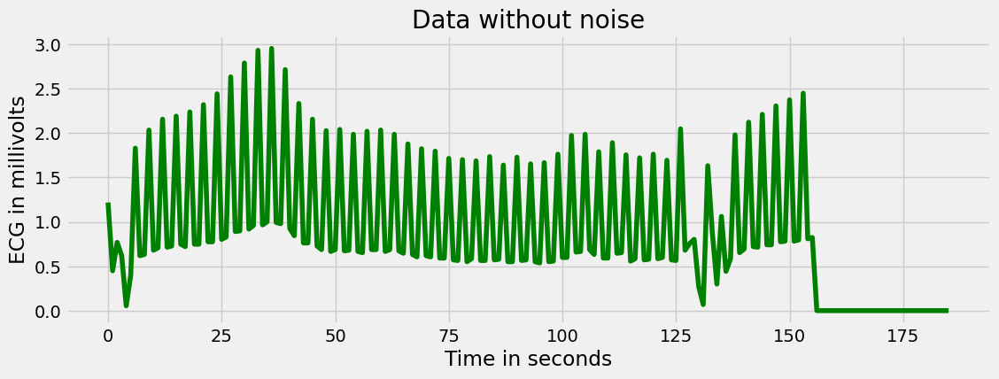

In [ ]:
plt.figure(figsize=[12, 4.02])
plt.plot(df.iloc[0, :186], color='green')
plt.title('Data without noise')
plt.ylabel('ECG in millivolts')  # Corrected the units for ECG
plt.xlabel('Time in seconds')  # Changed from minutes to seconds
plt.show()  # Display the plot


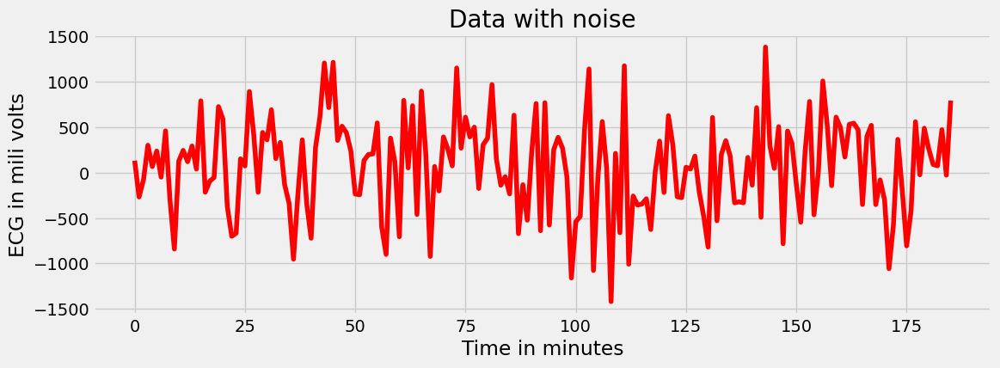

In [ ]:
def add_guassian_noise2(signal):
    noise = np.random.normal(0,500,186)
    return(signal + noise)
plt.figure(figsize = [12,4.02])
plt.plot(add_guassian_noise2(df.iloc[0,:186]), color = 'red')
plt.title('Data with noise')
plt.ylabel('ECG in mili volts')
plt.xlabel('Time in minutes')
plt.show()

In [ ]:
df.head()

,0,1,2,3,4,5,6,7,8,9,...,178,179,180,181,182,183,184,185,186,187
4780,1.217687,0.448980,0.768707,0.619048,0.054422,0.401361,1.829932,0.619048,0.632653,2.034014,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14510,2.571429,0.888889,0.682540,0.661376,0.185185,0.153439,0.380952,0.142857,0.111111,0.269841,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
51255,0.328652,0.098315,0.230337,1.387640,0.452247,0.550562,2.075843,0.705056,0.707865,2.193820,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
61800,2.273302,0.935229,0.379147,0.505529,0.221169,0.271722,0.864139,0.296998,0.287520,0.875197,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
8156,2.315961,0.899023,0.459283,0.469055,0.175896,0.293160,1.208469,0.390879,0.416938,1.325733,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


**FFT**

/opt/conda/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


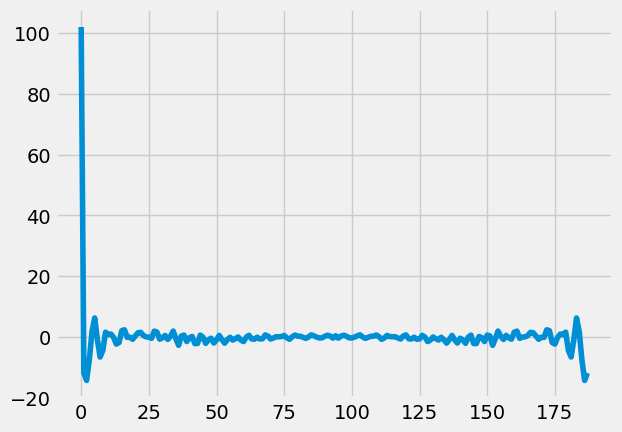

In [ ]:
x = train_data.iloc[0,:].values
from numpy.fft import fft, ifft
x = train_data.iloc[0,:]
X = fft(x)
plt.plot(X)

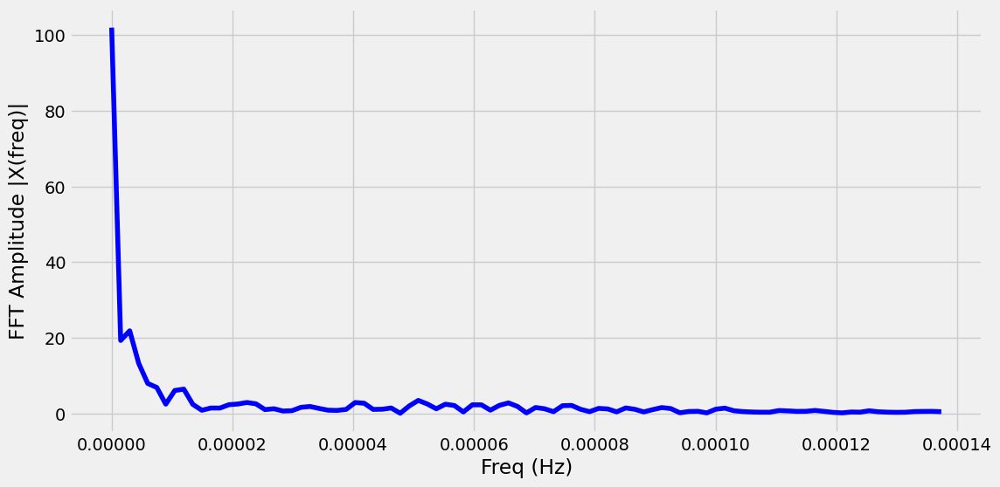

In [ ]:
X = fft(train_data.iloc[0,:186])
N = len(X)
n = np.arange(N)
# get the sampling rate
sr = 1 / (60*60)
T = N/sr
freq = n/T

# Get the one-sided specturm
n_oneside = N//2
# get the one side frequency
f_oneside = freq[:n_oneside]

plt.figure(figsize = (12, 6))
plt.plot(f_oneside, np.abs(X[:n_oneside]), 'b')
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Amplitude |X(freq)|')
plt.show()

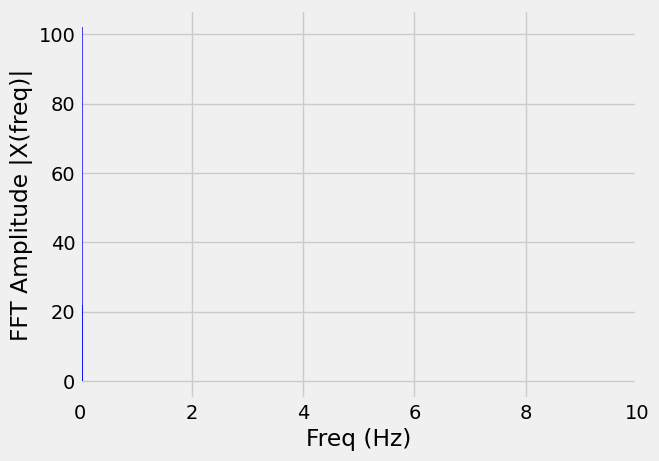

In [ ]:
N = len(X)
n = np.arange(N)
T = N/sr
freq = n/T
plt.stem(freq, np.abs(X), 'b', \
         markerfmt=" ", basefmt="-b")
plt.xlabel('Freq (Hz)')
plt.ylabel('FFT Amplitude |X(freq)|')
plt.xlim(0, 10);

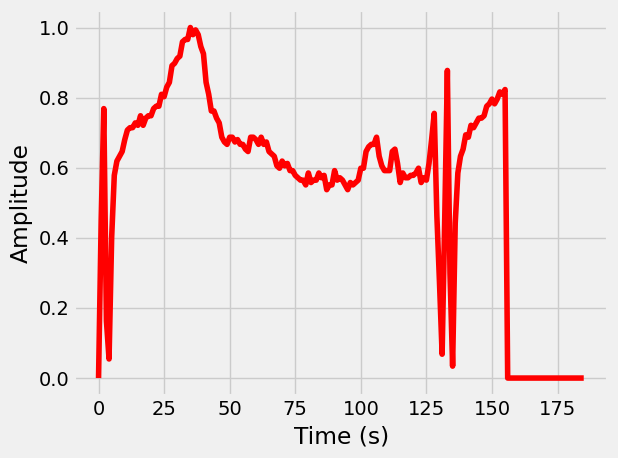

In [ ]:
plt.plot(ifft(X), 'r')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

/tmp/ipykernel_29/1605205695.py:1: RuntimeWarning: divide by zero encountered in divide
  t_h = 1/f_oneside / (60 * 60)


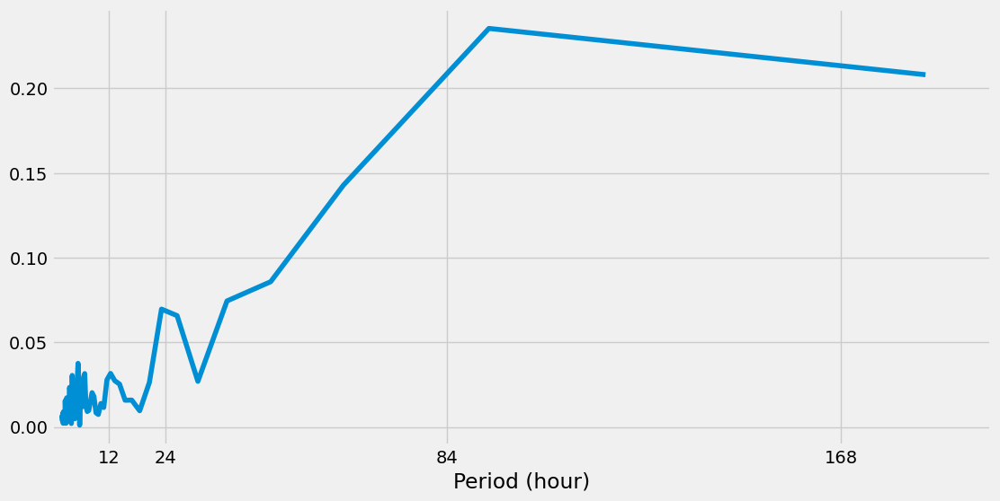

In [ ]:
t_h = 1/f_oneside / (60 * 60)

plt.figure(figsize=(12,6))
plt.plot(t_h, np.abs(X[:n_oneside])/n_oneside)
plt.xticks([12, 24, 84, 168])
plt.xlim(0, 200)
plt.xlabel('Period (hour)')
plt.show()


**PREPROCESSING**

In [ ]:
from sklearn.model_selection import train_test_split
X_train = train_data.drop(187, axis=1)
y_train = train_data[187]
X_test = test_data.drop(187, axis=1)
y_test = test_data[187]
X_train = X_train.values
y_train = y_train.values
X_test = X_test.values
y_test = y_test.values
unique, counts = np.unique(y_train, return_counts=True)

pd.DataFrame(np.asarray((unique, counts)).T)

,0,1
0,0.0,20000.0
1,1.0,20000.0
2,2.0,20000.0
3,3.0,20000.0


In [ ]:
val = X_train[0][1]
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
norm = Normalizer()
std = StandardScaler()
val1 = norm.fit_transform([[val]])
val2 = std.fit_transform([[val]])

In [ ]:
!pip install xgboost

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, fbeta_score
models = {
    "LR": LogisticRegression(solver='liblinear'),
    "KNN": KNeighborsClassifier(),
    "DT": DecisionTreeClassifier(),
    "RF": RandomForestClassifier(),
    "XGB": XGBClassifier(),
    "Naive Bayes": GaussianNB(),
    "SVC": SVC()

}
type(X_train)

numpy.ndarray

In [ ]:
!pip install scikit-learn  -U

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 84.7 MB/s eta 0:00:00:00:010:01
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 1.2.2
    Uninstalling scikit-learn-1.2.2:
      Successfully uninstalled scikit-learn-1.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
bigframes 0.22.0 requires google-cloud-bigquery[bqstorage,pandas]>=3.10.0, but you have google-cloud-bigquery 2.34.4 which is incompatible.
bigframes 0.22.0 requires google-cloud-storage>=2.0.0, but you have google-cloud-storage 1.44.0 which is incompatible.
bigframes 0.22.0 requires pandas<2.1.4,>=1.5.0, but you have pandas 2.2.2 which is incompatible.
cesium 0.12.3 requires numpy<3.0,>=2.0, but you have numpy 1.26.4 which is incompatible.
dataproc-jupyter-plugin 0.1.79 requires pydantic~=1.10.0, but you have pydantic 2.9.2 which is incompatible.


Training Model LR 
--------------
Training Accuracy: 0.7594375
Testing Accuracy: 0.729875


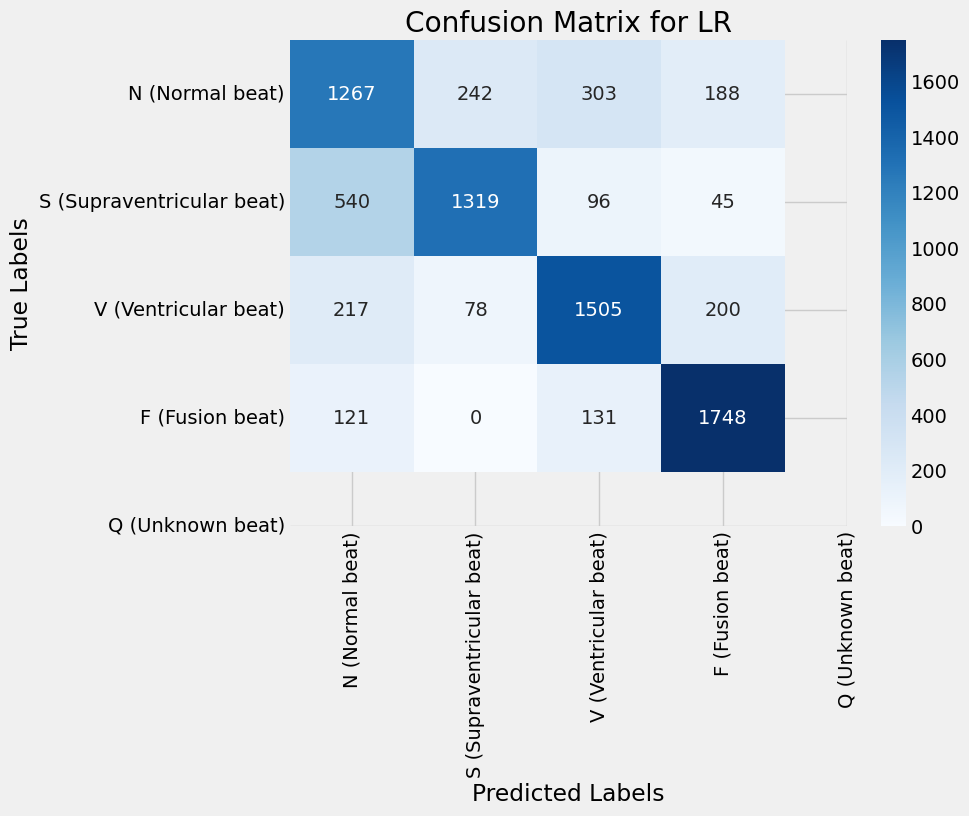

Exception ignored on calling ctypes callback function: <function ThreadpoolController._find_libraries_with_dl_iterate_phdr.<locals>.match_library_callback at 0x7e2417ca63b0>
Traceback (most recent call last):
  File "/opt/conda/lib/python3.10/site-packages/threadpoolctl.py", line 1005, in match_library_callback
    self._make_controller_from_path(filepath)
  File "/opt/conda/lib/python3.10/site-packages/threadpoolctl.py", line 1175, in _make_controller_from_path
    lib_controller = controller_class(
  File "/opt/conda/lib/python3.10/site-packages/threadpoolctl.py", line 114, in __init__
    self.dynlib = ctypes.CDLL(filepath, mode=_RTLD_NOLOAD)
  File "/opt/conda/lib/python3.10/ctypes/__init__.py", line 374, in __init__
    self._handle = _dlopen(self._name, mode)
OSError: dlopen() error


Recall Score: 0.729875
Precision Score: 0.729875
Testing F-1 Score: 0.7298749999999999
Testing F-Beta Score: 0.729875
------------------------------
Training Model KNN 
--------------
Training Accuracy: 0.988075
Testing Accuracy: 0.87925


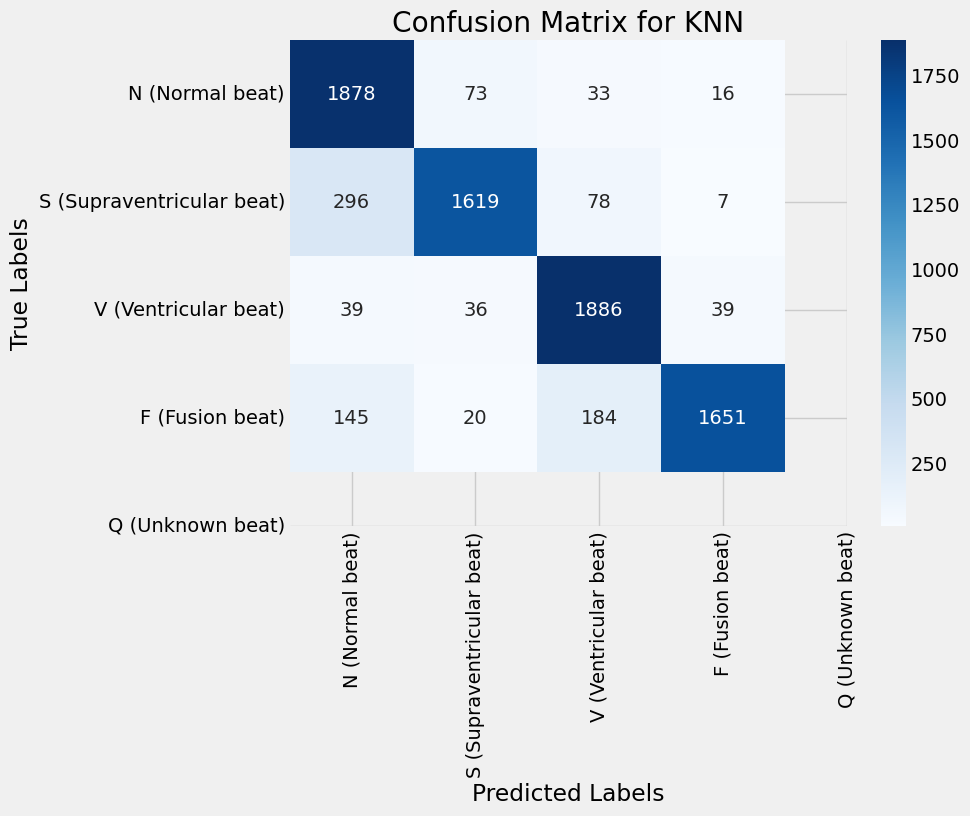

Recall Score: 0.87925
Precision Score: 0.87925
Testing F-1 Score: 0.8792500000000001
Testing F-Beta Score: 0.87925
------------------------------
Training Model DT 
--------------
Training Accuracy: 1.0
Testing Accuracy: 0.813


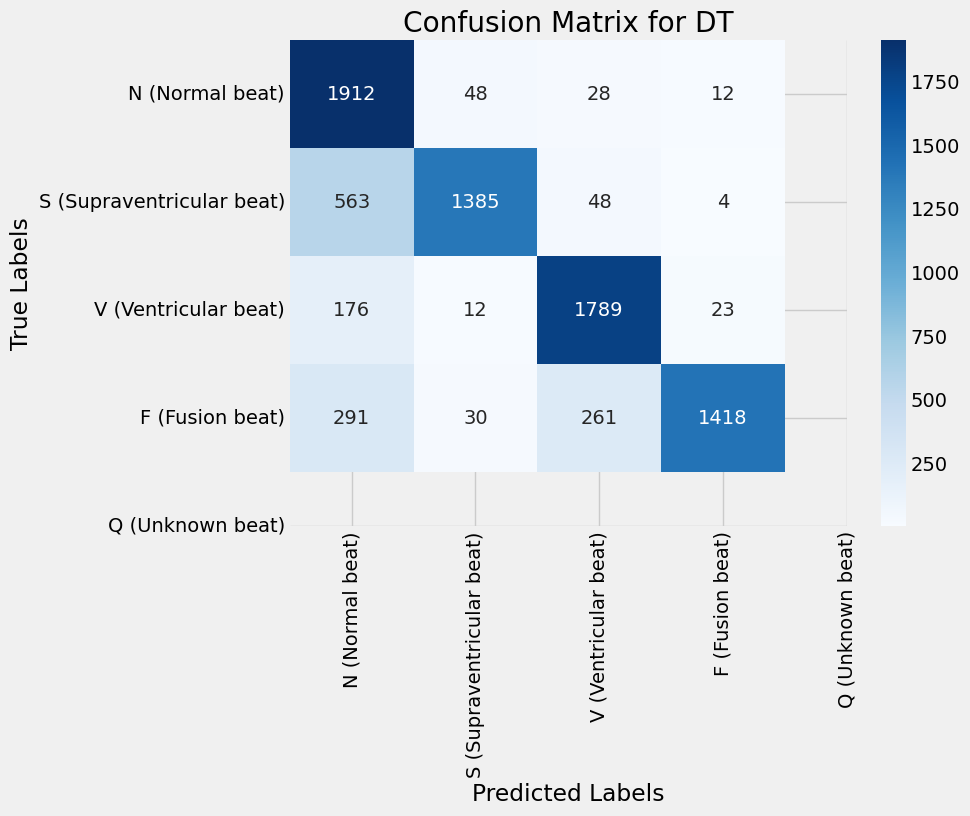

Recall Score: 0.813
Precision Score: 0.813
Testing F-1 Score: 0.813
Testing F-Beta Score: 0.813
------------------------------
Training Model RF 
--------------
Training Accuracy: 1.0
Testing Accuracy: 0.843


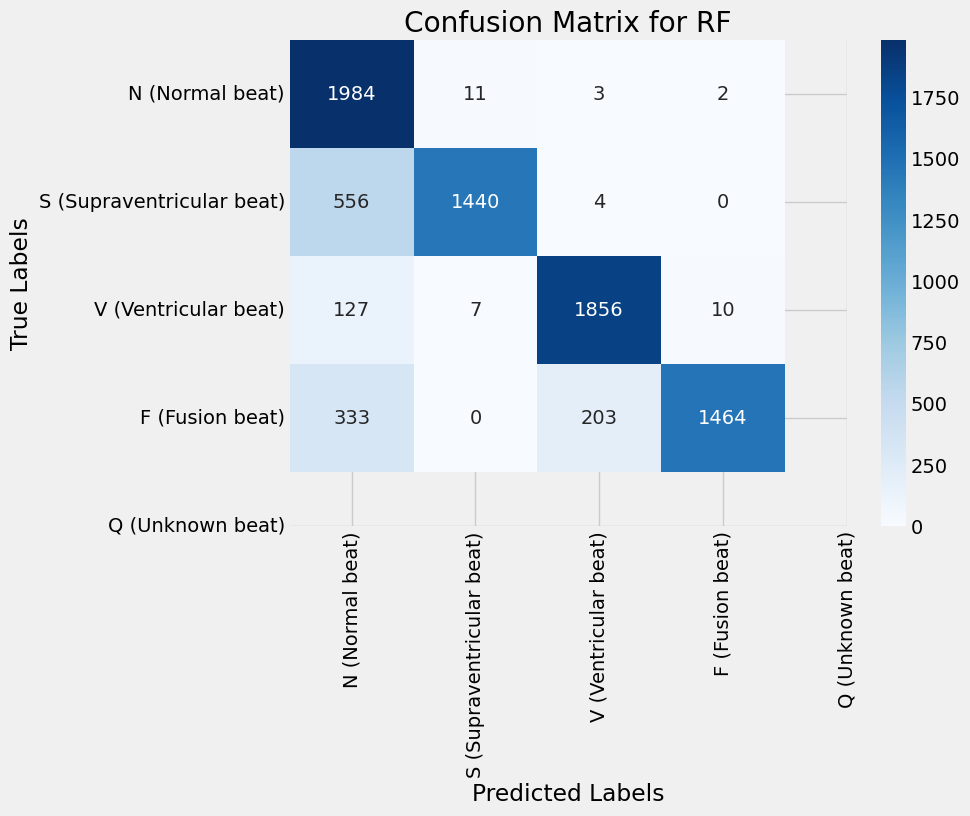

Recall Score: 0.843
Precision Score: 0.843
Testing F-1 Score: 0.843
Testing F-Beta Score: 0.843
------------------------------
Training Model XGB 
--------------
Training Accuracy: 0.9996625
Testing Accuracy: 0.892375


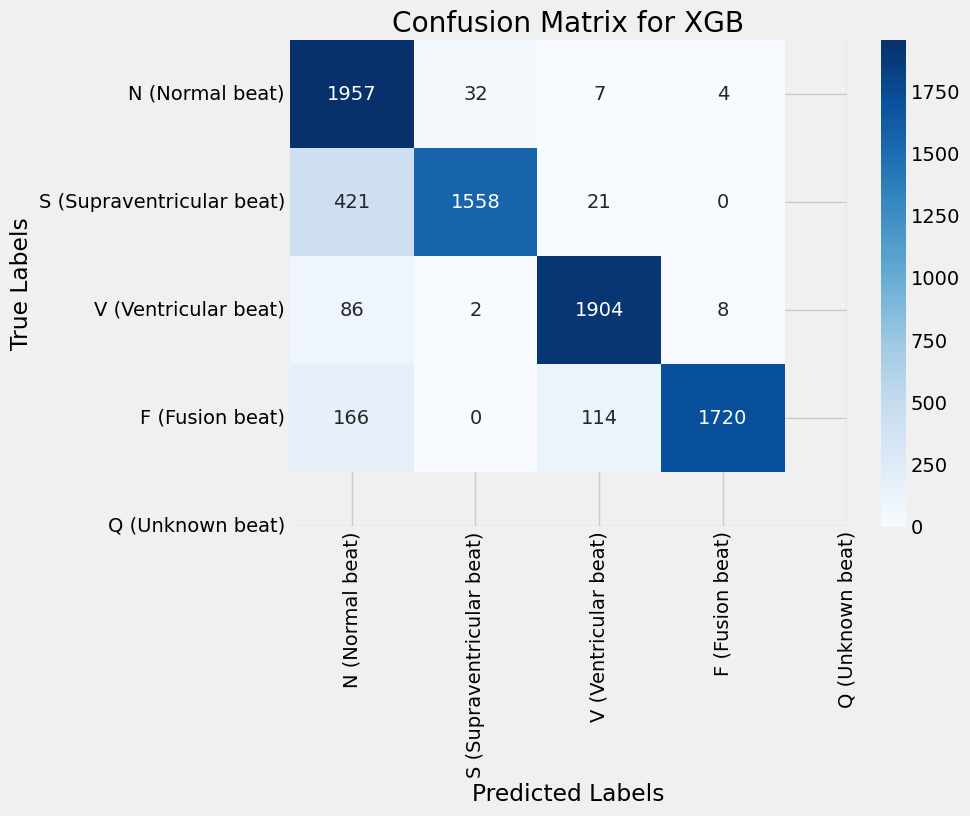

Recall Score: 0.892375
Precision Score: 0.892375
Testing F-1 Score: 0.892375
Testing F-Beta Score: 0.892375
------------------------------
Training Model Naive Bayes 
--------------
Training Accuracy: 0.5472875
Testing Accuracy: 0.532


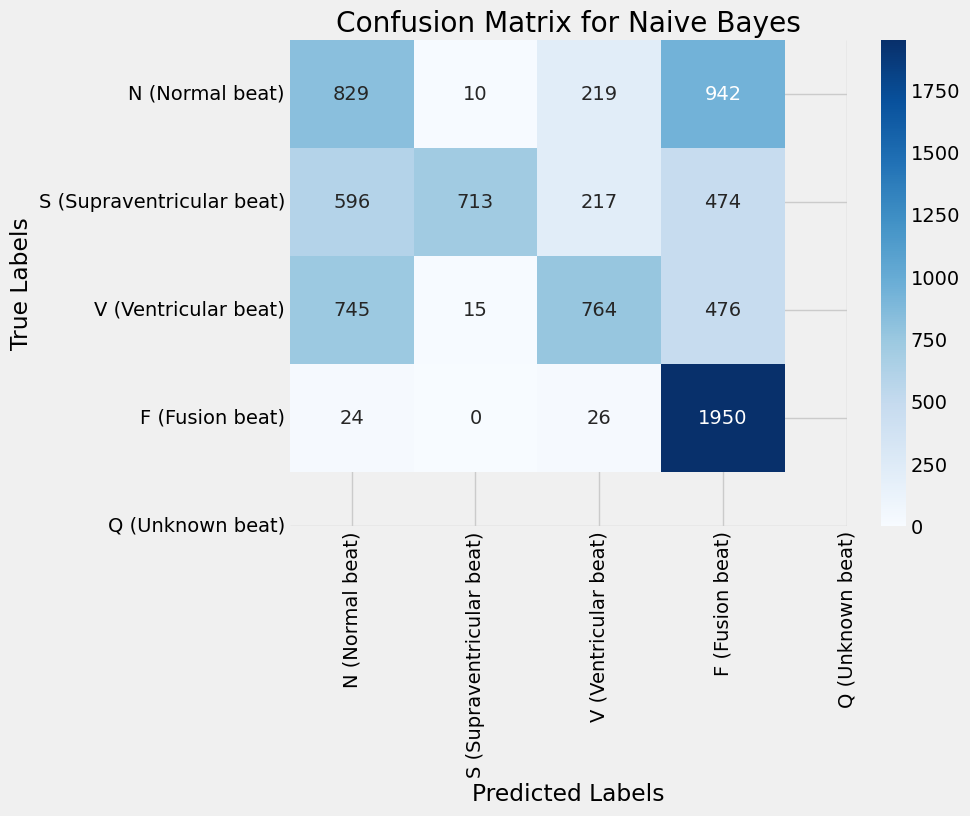

Recall Score: 0.532
Precision Score: 0.532
Testing F-1 Score: 0.532
Testing F-Beta Score: 0.532
------------------------------
Training Model SVC 
--------------
Training Accuracy: 0.9434
Testing Accuracy: 0.89225


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, recall_score, precision_score, f1_score, fbeta_score

# Iterate through the models and evaluate them
for name, model in models.items():
    print(f'Training Model {name} \n--------------')

    # Train the model
    model.fit(X_train, y_train)

    # Predict the test set
    y_pred = model.predict(X_test)

    # Training and Testing Accuracy
    print(f'Training Accuracy: {accuracy_score(y_train, model.predict(X_train))}')
    print(f'Testing Accuracy: {accuracy_score(y_test, y_pred)}')

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_pred)

    # Plot confusion matrix as a heatmap
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=list(class_labels.keys()), yticklabels=list(class_labels.keys()))
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title(f"Confusion Matrix for {name}")
    plt.show()

    # Recall, Precision, F1, and F-Beta Scores
    print("Recall Score:", recall_score(y_test, y_pred, average='micro'))
    print("Precision Score:", precision_score(y_test, y_pred, average='micro'))
    print(f"Testing F-1 Score: {f1_score(y_test, y_pred, average='micro')}")
    print(f"Testing F-Beta Score: {fbeta_score(y_test, y_pred, beta=0.5, average='micro')}")

    print('-' * 30)


**DEEP LEARNING INCEPTION**

In [ ]:
import numpy as np # linear algebra

import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

import os

import seaborn as sb

import matplotlib.pyplot as plt

plt.style.use('fivethirtyeight')

In [ ]:
from matplotlib import pyplot as plt

import seaborn as sns

import math

import random

from scipy.signal import resample

In [ ]:
import pandas as pd
train_df = pd.read_csv('/kaggle/input/heartbeat/mitbih_test.csv',header=None)
test_df = pd.read_csv('/kaggle/input/heartbeat/mitbih_test.csv',header=None)


In [ ]:
train_df.sample(10)

,0,1,2,3,4,5,6,7,8,9,...,178,179,180,181,182,183,184,185,186,187
12506,1.000000,0.678445,0.074205,0.095406,0.109541,0.116608,0.106007,0.116608,0.116608,0.127208,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17880,1.000000,0.500000,0.189873,0.113924,0.091772,0.028481,0.025316,0.009494,0.015823,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
15727,0.984592,0.782743,0.191063,0.095532,0.295840,0.315871,0.323575,0.320493,0.314330,0.317411,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1255,0.952239,0.567164,0.205970,0.143284,0.113433,0.056716,0.026866,0.011940,0.011940,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
14383,1.000000,0.818841,0.615942,0.376812,0.152174,0.079710,0.090580,0.134058,0.137681,0.141304,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
18328,1.000000,0.729268,0.280488,0.160976,0.190244,0.151220,0.114634,0.104878,0.114634,0.117073,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
14718,0.943425,0.946483,0.409786,0.000000,0.171254,0.313456,0.296636,0.272171,0.281346,0.287462,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4951,1.000000,0.767228,0.384380,0.078101,0.000000,0.098009,0.136294,0.124043,0.110260,0.099541,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
10585,0.830709,0.637795,0.354331,0.118110,0.000000,0.011811,0.066929,0.165354,0.145669,0.173228,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
338,0.892388,0.860892,0.254593,0.000000,0.118110,0.220472,0.249344,0.265092,0.262467,0.291339,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
#Classes:['N': 0, 'S': 1, 'V': 2, 'F': 3, 'Q': 4]

Classes = {

    0:'N',

    1:'S',

    2:'V',

    3:'F',

    4:'Q'

}



Classes_index = {

    'N': 0,

    'S': 1,

    'V': 2,

    'F': 3,

    'Q': 4

}

In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21892 entries, 0 to 21891
Columns: 188 entries, 0 to 187
dtypes: float64(188)
memory usage: 31.4 MB


In [ ]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21892 entries, 0 to 21891
Columns: 188 entries, 0 to 187
dtypes: float64(188)
memory usage: 31.4 MB


In [ ]:
feat_cols_name = [i for i in range(train_df.shape[1]-1)]



train_df.columns = feat_cols_name+["187"]

test_df.columns = feat_cols_name+["187"]

In [ ]:
train_df["187"] = train_df["187"].astype(int)

test_df["187"] = test_df["187"].astype(int)

In [ ]:
train_df["187"] = train_df["187"].map(Classes)

test_df["187"] = test_df["187"].map(Classes)

In [ ]:
train_df.columns[train_df.isnull().sum() != 0]

test_df.columns[train_df.isnull().sum() != 0]

Index([], dtype='object')

In [ ]:
train_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,177,178,179,180,181,182,183,184,185,186
count,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,...,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000,21892.000000
mean,0.894410,0.761902,0.426627,0.221596,0.201676,0.209891,0.204805,0.200992,0.197634,0.196022,...,0.005194,0.004588,0.004327,0.004020,0.003789,0.003638,0.003459,0.003166,0.003000,0.002946
std,0.234560,0.218659,0.228572,0.208711,0.177727,0.172194,0.177946,0.176142,0.170228,0.166707,...,0.046440,0.043128,0.042187,0.040255,0.039397,0.038535,0.037717,0.035903,0.035522,0.035266
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.924260,0.683366,0.251197,0.050505,0.082873,0.087912,0.072663,0.065997,0.064516,0.068493,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.990431,0.828996,0.432777,0.167630,0.147642,0.158111,0.144068,0.144509,0.150422,0.149029,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,1.000000,0.912319,0.583991,0.347092,0.259211,0.287356,0.298453,0.294563,0.289907,0.282956,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.991429,...,1.000000,0.980392,1.000000,0.966102,1.000000,1.000000,1.000000,1.000000,0.996053,1.000000


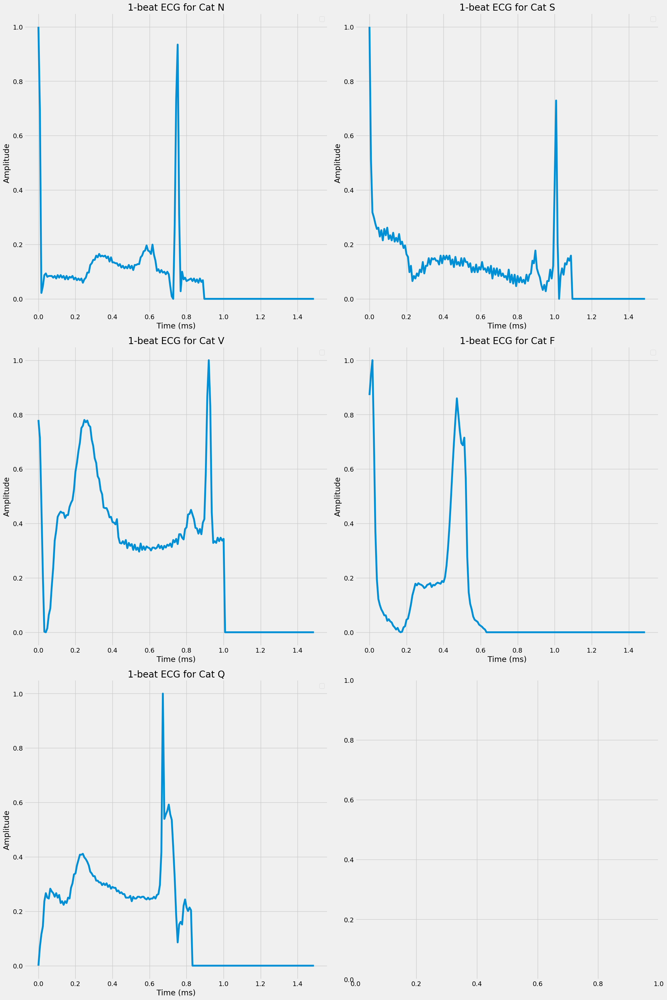

In [ ]:
fig, axes= plt.subplots(math.ceil(len(Classes_index.keys())/2), 2, figsize=(20,30), constrained_layout=True)

X = np.arange(0, len(feat_cols_name))*8/1000



i = 0

for key, value in Classes_index.items():

    ax = axes[int(i/2), i%2]

    ax.plot(X, train_df[train_df["187"] == key][feat_cols_name].sample(1).values.reshape(-1,1))

    ax.legend()

    ax.set(title="1-beat ECG for Cat {}".format(key))

    ax.set(ylabel="Amplitude")

    ax.set(xlabel="Time (ms)")

    i+=1

In [ ]:
def stretch(x):

    l = int(len(feat_cols_name) * (1 + (random.random()-0.5)/3))

    y = resample(x, l)

    if l < len(feat_cols_name):

        y_ = np.zeros(shape=(len(feat_cols_name), ))

        y_[:l] = y

    else:

        y_ = y[:len(feat_cols_name)]

    return y_



def amplify(x):

    alpha = (random.random()-0.5)

    factor = -alpha*x + (1+alpha)

    return x*factor



def gaussian_noise(signal):

    noise=np.random.normal(0,0.01, len(feat_cols_name))

    return (signal+noise)



def augment(x):

    result = np.zeros(shape= (4, len(feat_cols_name)))

    for i in range(3):

        if random.random() < 0.25:

            new_X = gaussian_noise(x)

        elif random.random() < 0.50:

            new_X = stretch(x)

        elif random.random() < 0.75:

            new_X = amplify(x)

        else:

            new_X = gaussian_noise(x)

            new_X = stretch(new_X)

            new_X = amplify(new_X)

        result[i, :] = new_X

    return result

In [ ]:
train_df["187"] = train_df["187"].map(Classes_index)

test_df["187"] = test_df["187"].map(Classes_index)

In [ ]:
X_train = train_df[feat_cols_name].values

y_train = train_df["187"].values



X_test = test_df[feat_cols_name].values

y_test = test_df["187"].values

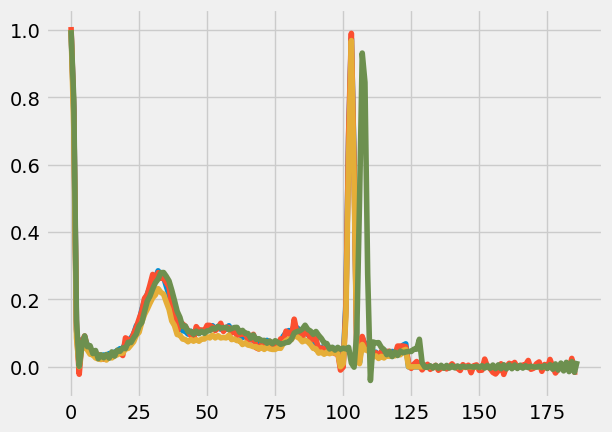

In [ ]:
plt.plot(X_train[0])

plt.plot(gaussian_noise(X_train[0]))

plt.plot(amplify(X_train[0]))

plt.plot(stretch(X_train[0]))

plt.show()

In [ ]:
from sklearn.model_selection import train_test_split



X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=2, stratify=y_train)

X_train.shape, y_train.shape, X_val.shape, y_val.shape

((19702, 187), (19702,), (2190, 187), (2190,))

In [ ]:
tmp_X_train = X_train.copy()

tmp_y_train = y_train.copy()



X_train = []

y_train = []

for i in range(0, len(tmp_y_train)):

    augment_X = augment(tmp_X_train[i])

    augment_y = np.ones(shape=(augment_X.shape[0],), dtype=int)*tmp_y_train[i]



    X_train.extend(augment_X)

    y_train.extend(augment_y)



X_train = np.array(X_train)

y_train = np.array(y_train)

In [ ]:
X_train.shape, y_train.shape

((78808, 187), (78808,))

In [ ]:
X_train = X_train.reshape((-1, len(feat_cols_name), 1))

X_val = X_val.reshape((-1, len(feat_cols_name), 1))

X_test = X_test.reshape((-1, len(feat_cols_name), 1))



y_train = y_train.reshape((-1, 1))

y_val = y_val.reshape((-1, 1))

y_test = y_test.reshape((-1, 1))

In [ ]:
input_shape = X_train.shape[1:]

nb_classes = len(Classes_index.keys())

input_shape, nb_classes

((187, 1), 5)

In [ ]:
!pip install tensorflow

/opt/conda/lib/python3.10/pty.py:89: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid, fd = os.forkpty()


In [ ]:
!pip install keras

In [ ]:
import keras

from keras.utils import to_categorical



y_train = to_categorical(y_train, num_classes=nb_classes)

y_val = to_categorical(y_val, num_classes=nb_classes)

y_test = to_categorical(y_test, num_classes=nb_classes)

In [ ]:
!pip install livelossplot

In [ ]:
from keras.layers import Conv1D, MaxPool1D, Concatenate, BatchNormalization, Activation, Input, Add, \
                         GlobalAveragePooling1D, Dense
from keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from livelossplot import PlotLossesKeras
from tensorflow.keras.metrics import Recall, Precision
import keras
import time

In [ ]:
import tensorflow.keras.backend as K



def f1_score(y_true, y_pred):

    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))

    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))

    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))

    precision = true_positives / (predicted_positives + K.epsilon())

    recall = true_positives / (possible_positives + K.epsilon())

    f1_val = 2*(precision*recall)/(precision+recall+K.epsilon())

    return f1_val

In [ ]:
class Classifier_INCEPTION:

    def __init__(self, weights_directory, input_shape, nb_classes, verbose=False, build=True, batch_size=64,

                 nb_filters=32, use_residual=True, use_bottleneck=True, depth=10, kernel_size=41, nb_epochs=1):

        self.weights_directory = weights_directory

        self.nb_filters = nb_filters

        self.use_residual = use_residual

        self.use_bottleneck = use_bottleneck

        self.depth = depth

        self.kernel_size = kernel_size - 1

        self.callbacks = None

        self.batch_size = batch_size

        self.bottleneck_size = 32

        self.nb_epochs = nb_epochs



        if build == True:

            self.model = self.build_model(input_shape, nb_classes)

            if (verbose == True):

                self.model.summary()

            self.verbose = verbose



    def _inception_module(self, input_tensor, stride=1, activation='linear'):



        if self.use_bottleneck and int(input_tensor.shape[-1]) > 1:

            input_inception = Conv1D(filters=self.bottleneck_size, kernel_size=1,

                                     padding='same', activation=activation, use_bias=False)(input_tensor)

        else:

            input_inception = input_tensor



        kernel_size_s = [self.kernel_size // (2 ** i) for i in range(3)]



        conv_list = []



        for i in range(len(kernel_size_s)):

            conv_list.append(Conv1D(filters=self.nb_filters, kernel_size=kernel_size_s[i],

                                    strides=stride, padding='same', activation=activation, use_bias=False)(

                input_inception))



        max_pool_1 = MaxPool1D(pool_size=3, strides=stride, padding='same')(input_tensor)



        conv_6 = Conv1D(filters=self.nb_filters, kernel_size=1,

                        padding='same', activation=activation, use_bias=False)(max_pool_1)



        conv_list.append(conv_6)



        x = Concatenate(axis=2)(conv_list)

        x = BatchNormalization()(x)

        x = Activation(activation='relu')(x)

        return x



    def _shortcut_layer(self, input_tensor, out_tensor):

        shortcut_y = Conv1D(filters=int(out_tensor.shape[-1]), kernel_size=1,

                            padding='same', use_bias=False)(input_tensor)

        shortcut_y = BatchNormalization()(shortcut_y)



        x = Add()([shortcut_y, out_tensor])

        x = Activation('relu')(x)

        return x



    def build_model(self, input_shape, nb_classes):

        input_layer = Input(input_shape)



        x = input_layer

        input_res = input_layer



        for d in range(self.depth):



            x = self._inception_module(x)



            if self.use_residual and d % 3 == 2:

                x = self._shortcut_layer(input_res, x)

                input_res = x



        gap_layer = GlobalAveragePooling1D()(x)



        output_layer = Dense(nb_classes, activation='softmax')(gap_layer)



        model = Model(inputs=input_layer, outputs=output_layer)



        model.compile(loss='categorical_crossentropy',

                      optimizer=Adam(),

                      metrics=['accuracy', Precision(), Recall(), f1_score])



        reduce_lr = ReduceLROnPlateau(monitor='val_accuracy',

                                      factor=0.5,

                                      patience=int(self.nb_epochs/20),

                                      min_lr=0.0001)



        file_path = os.path.join(self.weights_directory, "best_weights.keras") # Changed the file extension to .keras

        model_checkpoint = ModelCheckpoint(filepath=file_path,

                                           monitor='val_accuracy',

                                           mode="max",

                                           save_best_only=True)



        early_stopping = EarlyStopping(monitor="val_accuracy",

                                       mode="max",

                                       verbose=1,

                                       patience=int(self.nb_epochs/10))

        plotlosses = PlotLossesKeras()

        self.callbacks = [reduce_lr, model_checkpoint, early_stopping, plotlosses]

        return model



    def fit(self, x_train, y_train, x_val, y_val, class_weights=None):

        if self.batch_size is None:

            mini_batch_size = int(min(x_train.shape[0] / 10, 16))

        else:

            mini_batch_size = self.batch_size



        start_time = time.time()

        hist = self.model.fit(x_train, y_train,

                              batch_size=mini_batch_size,

                              epochs=self.nb_epochs,

                              verbose=self.verbose,

                              validation_data=(x_val, y_val),

                              callbacks=self.callbacks)



        duration = time.time() - start_time

        keras.backend.clear_session()

        print("Model take {} S to train ".format(duration))

        return hist

In [ ]:
weights_directory = "./"

inception = Classifier_INCEPTION(weights_directory, input_shape, nb_classes, 1,

                                 batch_size=512, build=True)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 187, 1)    │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d       │ (None, 187, 1)    │          0 │ input_layer[0][0] │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d (Conv1D)     │ (None, 187, 32)   │      1,280 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_1 (Conv1D)   │ (None, 187, 32)   │        640 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_2 (Conv1D)   │ (None, 187, 32)   │        320 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_3 (Conv1D)   │ (None, 187, 32)   │         32 │ max_pooling1d[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 187, 128)  │          0 │ conv1d[0][0],     │
│ (Concatenate)       │                   │            │ conv1d_1[0][0],   │
│                     │                   │            │ conv1d_2[0][0],   │
│                     │                   │            │ conv1d_3[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 187, 128)  │        512 │ concatenate[0][0] │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 187, 128)  │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_4 (Conv1D)   │ (None, 187, 32)   │      4,096 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling1d_1     │ (None, 187, 128)  │          0 │ activation[0][0]  │
│ (MaxPooling1D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_5 (Conv1D)   │ (None, 187, 32)   │     40,960 │ conv1d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_6 (Conv1D)   │ (None, 187, 32)   │     20,480 │ conv1d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_7 (Conv1D)   │ (None, 187, 32)   │     10,240 │ conv1d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1d_8 (Conv1D)   │ (None, 187, 32)   │      4,096 │ max_pooling1d_1[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 187, 128)  │          0 │ conv1d_5[0][0],   │
│ (Concatenate)       │                   │            │ conv1d_6[0][0],   │
│                     │                   │            │ conv1d_7[0][0],   │
│                     │                   │            │ conv1d_8[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 187, 128)  │        512 │ concatenate_1[0]… │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 187, 128)  │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼─────────────────

 Total params: 761,317 (2.90 MB)

 Trainable params: 757,989 (2.89 MB)

 Non-trainable params: 3,328 (13.00 KB)

In [ ]:
from tensorflow.keras.utils import plot_model



plot_model(inception.model, to_file="model_fig.jpg", show_shapes=True)

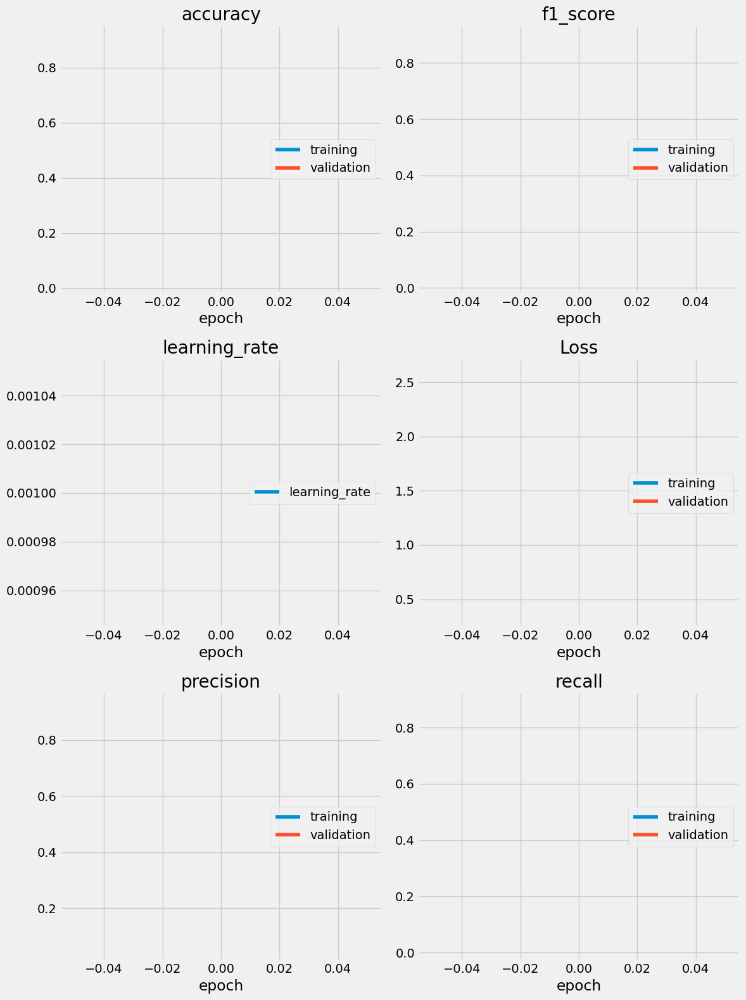

accuracy
	training         	 (min:    0.908, max:    0.908, cur:    0.908)
	validation       	 (min:    0.026, max:    0.026, cur:    0.026)
f1_score
	training         	 (min:    0.890, max:    0.890, cur:    0.890)
	validation       	 (min:    0.024, max:    0.024, cur:    0.024)
learning_rate
	learning_rate    	 (min:    0.001, max:    0.001, cur:    0.001)
Loss
	training         	 (min:    0.357, max:    0.357, cur:    0.357)
	validation       	 (min:    2.601, max:    2.601, cur:    2.601)
precision
	training         	 (min:    0.925, max:    0.925, cur:    0.925)
	validation       	 (min:    0.058, max:    0.058, cur:    0.058)
recall
	training         	 (min:    0.881, max:    0.881, cur:    0.881)
	validation       	 (min:    0.016, max:    0.016, cur:    0.016)
154/154 ━━━━━━━━━━━━━━━━━━━━ 46s 188ms/step - accuracy: 0.8571 - f1_score: 0.7851 - loss: 0.5328 - precision: 0.9001 - recall: 0.7651 - val_accuracy: 0.0256 - val_f1_score: 0.0243 - val_loss: 2.6005 - val_precision: 0.05

In [ ]:
history = inception.fit(X_train, y_train, X_val, y_val)

In [ ]:
inception.model.load_weights("./best_weights.keras")

In [ ]:
inception.model.evaluate(X_val, y_val)

69/69 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.0245 - f1_score: 0.0258 - loss: 2.6086 - precision: 0.0625 - recall: 0.0170    


[2.6005074977874756,
 0.02557077631354332,
 0.05802047625184059,
 0.01552511379122734,
 0.023849140852689743]

In [ ]:
inception.model.evaluate(X_test, y_test)

685/685 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.0044 - f1_score: 0.0029 - loss: 2.5661 - precision: 0.0088 - recall: 0.0021


[2.6009035110473633,
 0.026539376005530357,
 0.04646055027842522,
 0.012561666779220104,
 0.017127595841884613]

In [ ]:
y_hat = inception.model.predict(X_test)

685/685 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step


In [ ]:
from sklearn.metrics import roc_curve, auc
from itertools import cycle

def ROC_plot(y_true_ohe, y_hat_ohe, label_encoder, n_classes):
    lw = 2
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_true_ohe[:, i], y_hat_ohe[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

    mean_tpr = np.zeros_like(all_fpr)
    for i in range(n_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= n_classes
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    fpr["micro"], tpr["micro"], _ = roc_curve(y_true_ohe.ravel(), y_hat_ohe.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

    plt.figure(figsize=(20,20))
    plt.plot(
        fpr["micro"],
        tpr["micro"],
        label="micro-average ROC curve (area = {0:0.2f})".format(roc_auc["micro"]),
        color="deeppink",
        linestyle=":",
        linewidth=4,
    )

    plt.plot(
        fpr["macro"],
        tpr["macro"],
        label="macro-average ROC curve (area = {0:0.2f})".format(roc_auc["macro"]),
        color="navy",
        linestyle=":",
        linewidth=4,
    )

    colors = cycle(["aqua", "darkorange", "cornflowerblue"])
    for i, color in zip(range(n_classes), colors):
        plt.plot(
            fpr[i],
            tpr[i],
            color=color,
            lw=lw,
            label="ROC curve of class {0} (area = {1:0.2f})".format(list(label_encoder.keys())[i], roc_auc[i]))

    plt.plot([0, 1], [0, 1], "k--", lw=lw)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Multiclass characteristic")
    plt.legend(loc="lower right")
    plt.show()

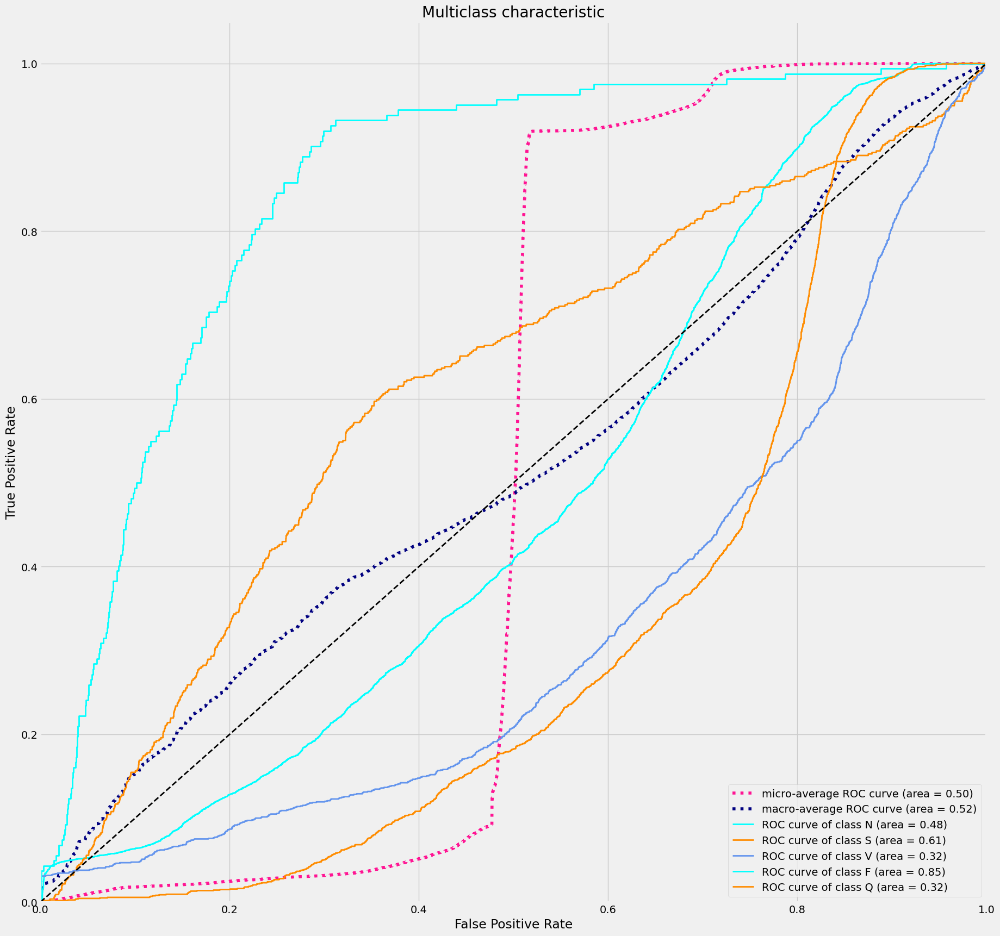

In [ ]:
ROC_plot(y_test, y_hat, Classes_index, nb_classes)

Accuracy: 0.0265


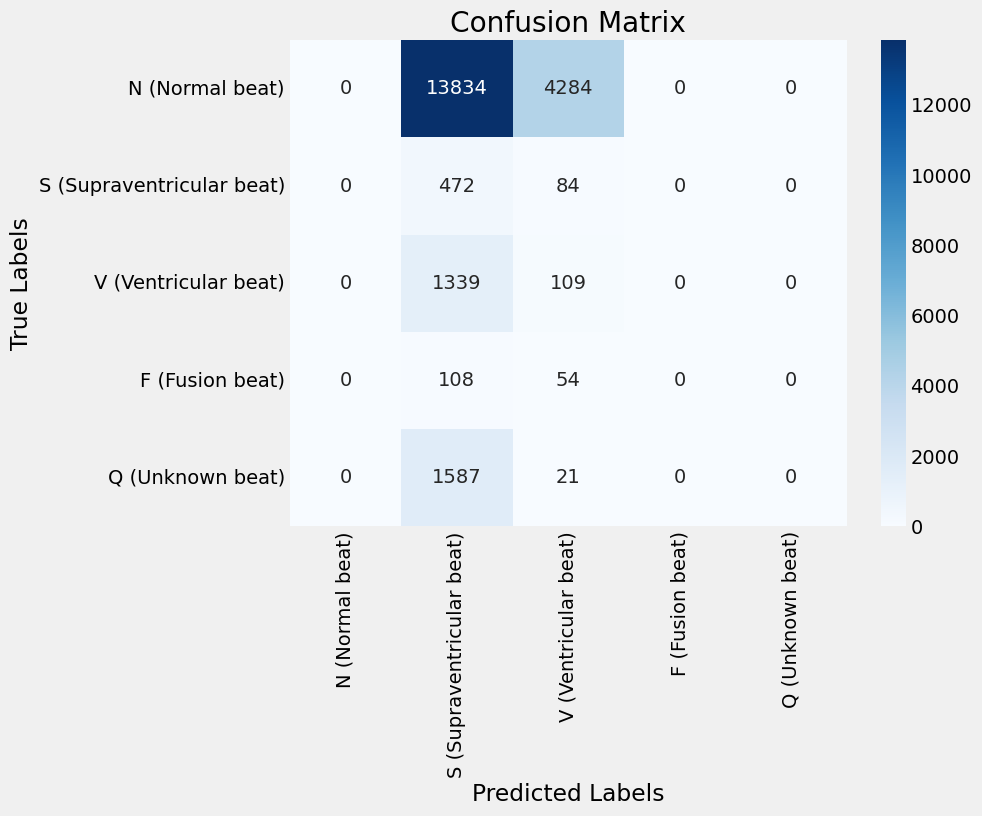

Classification Report:
                           precision    recall  f1-score   support

          N (Normal beat)       0.00      0.00      0.00     18118
S (Supraventricular beat)       0.03      0.85      0.05       556
     V (Ventricular beat)       0.02      0.08      0.04      1448
          F (Fusion beat)       0.00      0.00      0.00       162
         Q (Unknown beat)       0.00      0.00      0.00      1608

                 accuracy                           0.03     21892
                macro avg       0.01      0.18      0.02     21892
             weighted avg       0.00      0.03      0.00     21892


Label Mapping:
Class 0: N (Normal beat)
Class 1: S (Supraventricular beat)
Class 2: V (Ventricular beat)
Class 3: F (Fusion beat)
Class 4: Q (Unknown beat)


/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

def print_score(y_hat, y_true, class_labels):
    # Print accuracy score
    accuracy = accuracy_score(y_true, y_hat)
    print(f"Accuracy: {accuracy:.4f}")

    # Generate confusion matrix
    cm = confusion_matrix(y_true, y_hat)

    # Plot confusion matrix
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=list(class_labels.keys()), yticklabels=list(class_labels.keys()))
    plt.xlabel("Predicted Labels")
    plt.ylabel("True Labels")
    plt.title("Confusion Matrix")
    plt.show()

    # Print classification report
    print("Classification Report:")
    print(classification_report(y_true, y_hat, target_names=list(class_labels.keys())))

    # Print label mapping
    print("\nLabel Mapping:")
    for label, index in class_labels.items():
        print(f"Class {index}: {label}")

# Class labels dictionary with descriptions
class_labels = {
    'N (Normal beat)': 0,   # Normal heartbeat
    'S (Supraventricular beat)': 1,  # Issues originating above the ventricles
    'V (Ventricular beat)': 2,  # Premature ventricular contraction (PVC) or escape beat
    'F (Fusion beat)': 3,   # Fusion of normal and ventricular beats
    'Q (Unknown beat)': 4   # Paced or unknown beat
}

# Example usage of the function
print_score(y_hat, y_true, class_labels)
